<a href="https://colab.research.google.com/github/artjow/-/blob/main/2D_to_3D_Creative_Creation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [DreamGaussian](https://github.com/dreamgaussian/dreamgaussian) image-to-3D
- 한장의 2D 이미지를 3D로 변환

In [ ]:
# 나눔 폰트 설치 (Nanum)
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 12 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/usr/share/fonts/truetype/

- 런타임다시시작할것 Crl+M

In [ ]:
import matplotlib.pyplot as plt

plt.rc('font', family='NanumBarunGothic')


In [ ]:
#@title install (only run once)
%rm -r dreamgaussian
!git clone https://github.com/dreamgaussian/dreamgaussian
%cd dreamgaussian

# install dependencies
!pip install -q einops plyfile dearpygui huggingface_hub diffusers accelerate transformers xatlas trimesh PyMCubes pymeshlab rembg[gpu,cli] omegaconf ninja

# build extension from source (can be slow)
# !git clone --recursive https://github.com/ashawkey/diff-gaussian-rasterization
# !pip install -q ./diff-gaussian-rasterization
# !pip install -q ./simple-knn

# pre-built wheels (faster)
!pip install -q https://github.com/camenduru/diff-gaussian-rasterization/releases/download/v1.0/diff_gaussian_rasterization-0.0.0-cp310-cp310-linux_x86_64.1.whl
!pip install -q https://github.com/camenduru/diff-gaussian-rasterization/releases/download/v1.0/simple_knn-0.0.0-cp310-cp310-linux_x86_64.1.whl

# nvdiffrast
!pip install -q git+https://github.com/NVlabs/nvdiffrast

# kiuikit
!pip install -q git+https://github.com/ashawkey/kiuikit

%mkdir -p data

rm: cannot remove 'dreamgaussian': No such file or directory
Cloning into 'dreamgaussian'...
remote: Enumerating objects: 138, done.
remote: Counting objects: 100% (79/79), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 138 (delta 55), reused 41 (delta 35), pack-reused 59
Receiving objects: 100% (138/138), 1.23 MiB | 4.11 MiB/s, done.
Resolving deltas: 100% (64/64), done.
/content/dreamgaussian
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 30.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 30.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 71.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.0/261.0 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 93.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.4/229.4 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━

/content/dreamgaussian/data


Saving 2D_freshpaprika.png to 2D_freshpaprika.png
/content/dreamgaussian


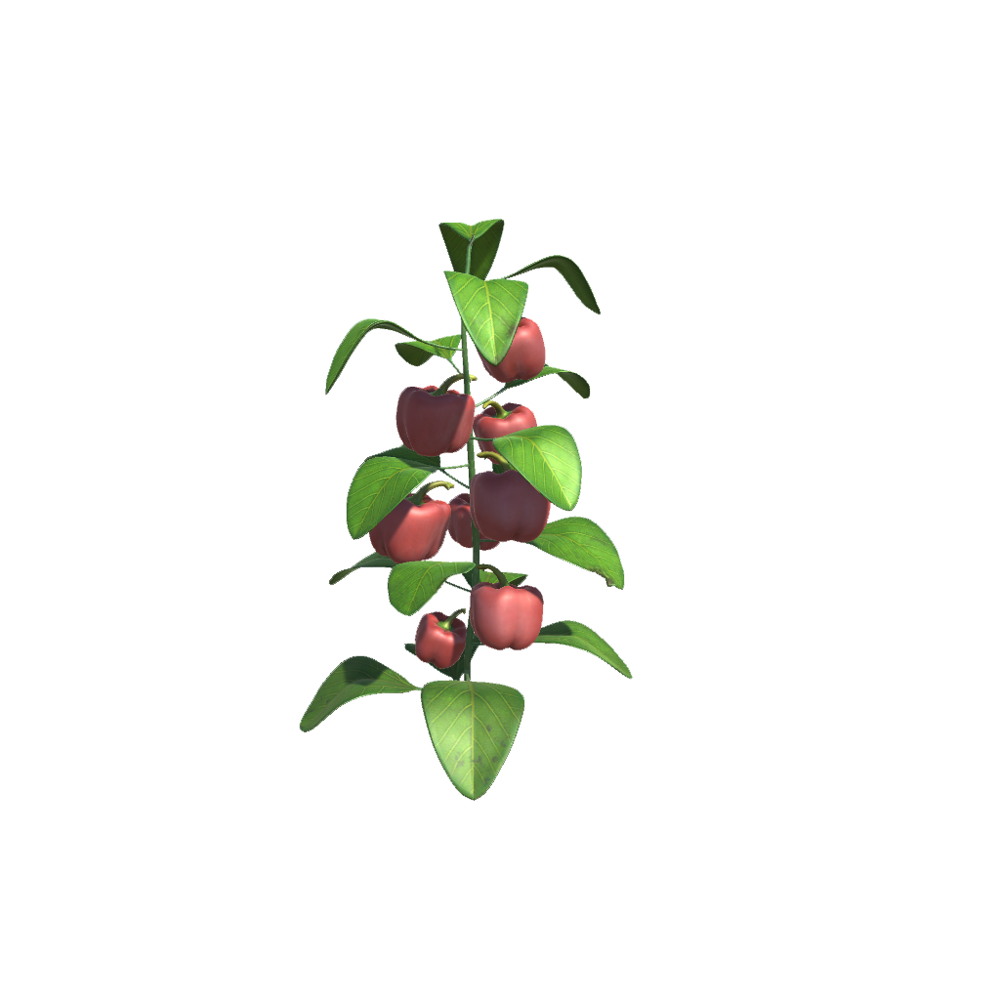

In [ ]:
# 2D_freshpaprika.png 파일 선택할것(2D 파프리카 이미지)

#@title upload image

import os

%cd data/
%rm * # remove all old files!
from google.colab import files
uploaded = files.upload()
IMAGE = os.path.basename(next(iter(uploaded))) # filename
%cd ..

# display image
from IPython.display import Image, display
display(Image(f'data/{IMAGE}', width=256, height=256))

100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 133GB/s]


[INFO] loading image data/2D_freshpaprika.png...
[INFO] background removal...
[INFO] recenter...


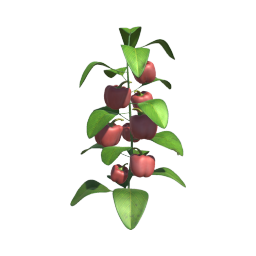

In [ ]:
#@title preprocess image

# preprocess
%run process.py data/{IMAGE}

NAME = os.path.splitext(IMAGE)[0]
IMAGE_PROCESSED = NAME + '_rgba.png'

# display processed image
from IPython.display import Image, display
display(Image(f'data/{IMAGE_PROCESSED}', width=256, height=256))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D



# Settings
* Elevation: estimated elevation angle, default to 0 (horizontal), range from [-90, 90]. If you upload a look-down image, try a value like -30.

In [ ]:
#@markdown ####**Settings:**
Elevation = 0 #@param {type: 'integer'}

In [ ]:
#@title training!

# stage 1
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True

# stage 2
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True

[INFO] load image from data/2D_freshpaprika_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] loaded zero123!


100%|██████████| 500/500 [01:06<00:00,  7.54it/s]
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[INFO] save model to logs/2D_freshpaprika_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 55.731544494628906] μ = 0.14467790722846985 σ =
1.148888111114502

[INFO] mesh cleaning: (33288, 3) --> (16127, 3), (66556, 3) --> (32266, 3)
[INFO] marching cubes result: torch.Size([16127, 3]) (-0.6063804626464844-0.7039462327957153), torch.Size([32266, 3])
[INFO] unwrap uv...
[INFO] save model to logs/2D_freshpaprika_mesh.obj.
[load_obj] use texture from: logs/2D_freshpaprika_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([20861, 3]), f: torch.Size([32266, 3])
[Mesh loading] vn: torch.Size([20861, 3]), fn: torch.Size([32266, 3])
[INFO] load image from data/2D_freshpaprika_rgba.png...
[INFO] loading zero123...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] loaded zero123!


100%|██████████| 50/50 [00:44<00:00,  1.14it/s]


[INFO] save model to logs/2D_freshpaprika.obj.


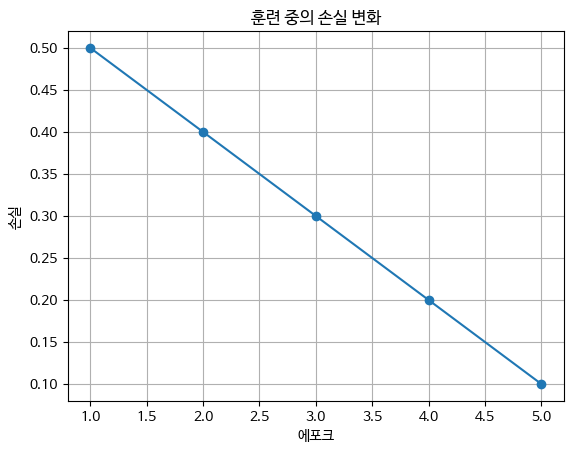

In [ ]:
import matplotlib.pyplot as plt

# 손실(loss) 데이터 예시 (여기에 실제 훈련 중의 손실 데이터를 삽입합니다)
loss_data = [0.5, 0.4, 0.3, 0.2, 0.1]

# 훈련 반복 횟수 (에포크)에 따른 손실 데이터를 그래프로 표시
plt.plot(range(1, len(loss_data) + 1), loss_data, marker='o', linestyle='-')
plt.title('훈련 중의 손실 변화')
plt.xlabel('에포크')
plt.ylabel('손실')
plt.grid(True)
plt.show()


위 그래프의 x 축과 y-축은 손실값을 나타냅니다. 손실은 모델의 성능을 나타내는 지표로, 값이 낮을수록 모델이 예측을 더 잘 수행하고 있음을 의미합니다.
그래프는 에포크가 증가함에 따라 초기에는 손실이 높고 점차 감소하는 경향을 보이며 모델이 훈련이 잘 되고 있음을 나타냅니다.

In [ ]:
#@title render a video for displaying

# the final mesh is saved to ./logs/NAME.obj
%run -m kiui.render logs/{NAME}.obj --save_video {NAME}.mp4 --wogui --force_cuda_rast

from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width=450):
  video_file = open(video_path, "r+b").read()
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

show_video(f'{NAME}.mp4')

[load_obj] use texture from: logs/2D_freshpaprika_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([20861, 3]), f: torch.Size([32266, 3])
[Mesh loading] vn: torch.Size([20861, 3]), fn: torch.Size([32266, 3])


100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


In [ ]:
import os
current_directory = os.getcwd()
print(current_directory)


/content/dreamgaussian


In [ ]:
# 2D to 3D 변환한 데이터 영상 다운로드

from google.colab import files
files.download(f"{NAME}.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 영상 이미지로 변환

!pip install moviepy


In [ ]:
from moviepy.editor import VideoFileClip

# 변환할 동영상 파일명
video_path = "/content/dreamgaussian/2D_freshpaprika.mp4"

# VideoFileClip을 사용하여 동영상 불러오기
video_clip = VideoFileClip(video_path)

# 이미지로 변환하고 저장
image_sequence = video_clip.write_images_sequence("frame_%04d.png")

# 이미지로 저장된 프레임들이 있는 폴더를 확인할 수 있습니다.
print("프레임 이미지 저장 완료:", image_sequence)


Moviepy - Writing frames frame_%04d.png.


Moviepy - Done writing frames frame_%04d.png.
프레임 이미지 저장 완료: ['frame_0000.png', 'frame_0001.png', 'frame_0002.png', 'frame_0003.png', 'frame_0004.png', 'frame_0005.png', 'frame_0006.png', 'frame_0007.png', 'frame_0008.png', 'frame_0009.png', 'frame_0010.png', 'frame_0011.png', 'frame_0012.png', 'frame_0013.png', 'frame_0014.png', 'frame_0015.png', 'frame_0016.png', 'frame_0017.png', 'frame_0018.png', 'frame_0019.png', 'frame_0020.png', 'frame_0021.png', 'frame_0022.png', 'frame_0023.png', 'frame_0024.png', 'frame_0025.png', 'frame_0026.png', 'frame_0027.png', 'frame_0028.png', 'frame_0029.png', 'frame_0030.png', 'frame_0031.png', 'frame_0032.png', 'frame_0033.png', 'frame_0034.png', 'frame_0035.png', 'frame_0036.png', 'frame_0037.png', 'frame_0038.png', 'frame_0039.png', 'frame_0040.png', 'frame_0041.png', 'frame_0042.png', 'frame_0043.png', 'frame_0044.png', 'frame_0045.png', 'frame_0046.png', 'frame_0047.png', 'frame_0048.png', 'frame_0049.png', 'frame_0050.png', 'frame_0051.png', 'f

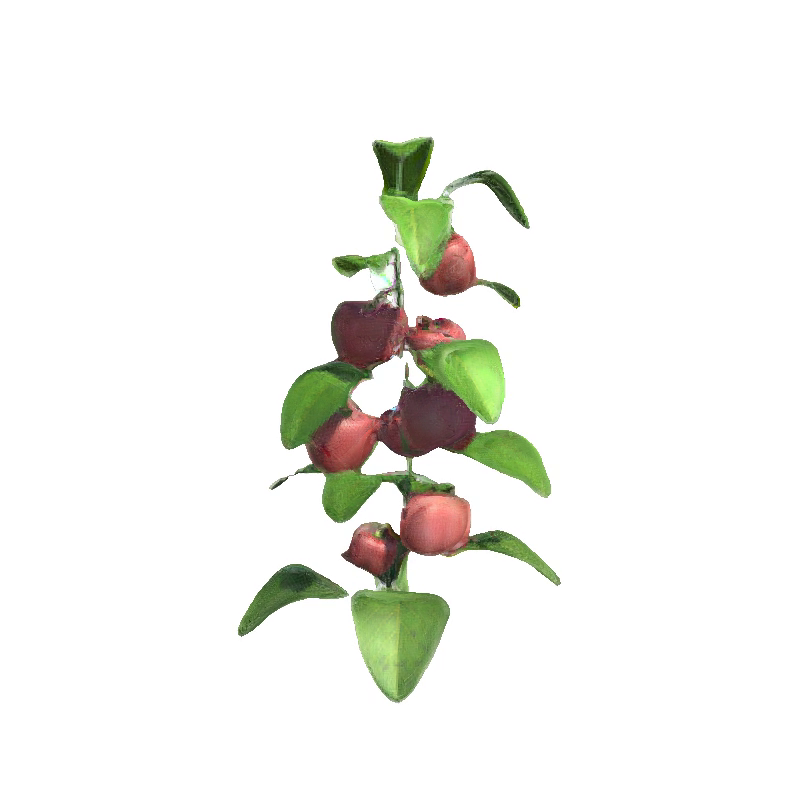

In [ ]:
# 영상 중 이미지 하나 시각화 하기(2D to 3D 변환)

from PIL import Image
import IPython.display as display

# 이미지 파일 경로 (frame_0001.png와 같은 이미지 파일)
image_path = "frame_0001.png"

# 이미지 열기
image = Image.open(image_path)

# 이미지 표시
display.display(image)


In [ ]:
#@title 2D to 3D 변환 결과 다운로드
from google.colab import files

# OBJ 파일 다운로드
files.download('/content/dreamgaussian/logs/2D_freshpaprika_mesh.obj')

# 텍스처 파일 다운로드
files.download('/content/dreamgaussian/logs/2D_freshpaprika_mesh_albedo.png')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title OBJ 파일을 포인트 클라우드로 변환

import numpy as np

def obj_to_point_cloud(obj_filename, point_cloud_filename):
    vertices = []

    with open(obj_filename, 'r') as obj_file:
        for line in obj_file:
            if line.startswith('v '):
                parts = line.split()
                x, y, z = map(float, parts[1:4])
                vertices.append((x, y, z))

    # 정점 정보를 NumPy 배열로 변환
    point_cloud = np.array(vertices)

    # 포인트 클라우드를 저장
    np.savetxt(point_cloud_filename, point_cloud, fmt='%f %f %f')
    print(f'포인트 클라우드가 {point_cloud_filename}에 저장되었습니다.')

# OBJ 파일을 포인트 클라우드로 변환
obj_to_point_cloud('/content/dreamgaussian/logs/2D_freshpaprika_mesh.obj', '/content/dreamgaussian/point_cloud.txt')


포인트 클라우드가 /content/dreamgaussian/point_cloud.txt에 저장되었습니다.


In [ ]:
#@title point_cloud.txt 파일을 PLY 포인트 클라우드로 변환
# point_cloud.txt 파일을 PLY 포인트 클라우드로 변환작업을 통해 정밀한 포인트클라우드를 만듬으로서
# mAP 성능을 높히게 된다.

def save_point_cloud_as_ply(point_cloud, ply_filename):
    with open(ply_filename, 'w') as ply_file:
        # PLY 파일 헤더 작성
        ply_file.write("ply\n")
        ply_file.write("format ascii 1.0\n")
        ply_file.write(f"element vertex {len(point_cloud)}\n")
        ply_file.write("property float x\n")
        ply_file.write("property float y\n")
        ply_file.write("property float z\n")
        ply_file.write("end_header\n")

        # 포인트 클라우드 데이터 작성
        for point in point_cloud:
            x, y, z = point
            ply_file.write(f"{x} {y} {z}\n")

# point_cloud.txt 파일을 PLY 포인트 클라우드로 변환
point_cloud = np.loadtxt('/content/dreamgaussian/point_cloud.txt')
save_point_cloud_as_ply(point_cloud, '/content/dreamgaussian/point_cloud.ply')


위의 코드는 "point_cloud.txt" 파일을 PLY (Polygon File Format) 포인트 클라우드로 변환하는 Python 함수를 정의한 예제입니다. 이 코드는 다음과 같은 작업을 수행합니다:

1. `save_point_cloud_as_ply` 함수 정의:
   - `save_point_cloud_as_ply` 함수는 PLY 파일에 포인트 클라우드 데이터를 저장하는 역할을 합니다.

2. PLY 파일 헤더 작성:
   - 먼저 PLY 파일의 헤더 부분을 작성합니다. 이 부분은 PLY 파일 형식과 포인트 클라우드의 속성을 정의합니다.
   - "ply" 라인은 PLY 파일임을 나타냅니다.
   - "format ascii 1.0"은 PLY 파일 형식을 ASCII 형식 버전 1.0으로 지정합니다.
   - "element vertex {len(point_cloud)}"는 포인트 클라우드의 버텍스(점) 수를 나타냅니다. `len(point_cloud)`는 포인트 클라우드의 길이를 사용하여 계산됩니다.
   - "property float x", "property float y", "property float z"는 각 점의 x, y, z 좌표 속성을 정의합니다.
   - "end_header"는 헤더 부분의 끝을 나타냅니다.

3. 포인트 클라우드 데이터 작성:
   - 헤더 부분을 작성한 후, 실제 포인트 클라우드 데이터를 PLY 파일에 작성합니다.
   - `for` 루프를 사용하여 각 포인트를 순회하며 x, y, z 좌표를 PLY 파일에 작성합니다. 이러한 데이터는 ASCII 형식으로 저장됩니다.

4. 주어진 "point_cloud.txt" 파일을 불러와서 `numpy`를 사용하여 포인트 클라우드 데이터를 읽어옵니다.

5. `save_point_cloud_as_ply` 함수를 사용하여 변환된 PLY 파일을 저장합니다. PLY 파일의 이름은 "point_cloud.ply"로 설정됩니다.
결과적으로, 이 코드를 실행하면 "point_cloud.txt" 파일의 데이터가 PLY 포인트 클라우드 형식으로 변환되어 "point_cloud.ply" 파일에 저장됩니다.이렇게 저장된 PLY 파일은 보다 원본에 가깝고 정밀한 포인트클라우드가 됩니다.
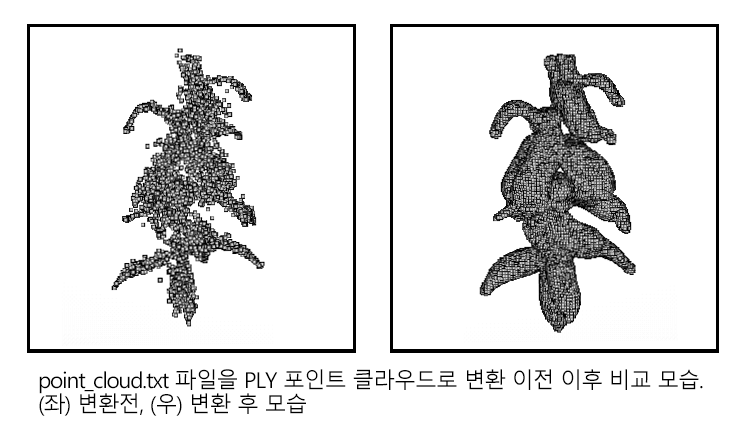

  fig.canvas.print_figure(bytes_io, **kw)



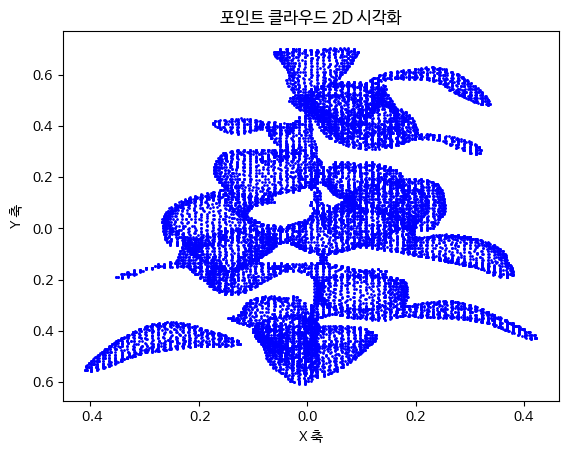

In [ ]:
#@title 포인트 클라우드 2D 시각화

import matplotlib.pyplot as plt

# 폰트 관련 설정
plt.rcParams['font.family'] = 'NanumBarunGothic'

# PLY 파일을 로드합니다.
point_cloud = np.loadtxt('/content/dreamgaussian/point_cloud.ply', skiprows=15)

# 2D 시각화를 위한 산점도 플롯을 생성합니다.
plt.scatter(point_cloud[:, 0], point_cloud[:, 1], s=1, c='blue')
plt.xlabel('X 축')
plt.ylabel('Y 축')
plt.title('포인트 클라우드 2D 시각화')

# 플롯을 표시합니다.
plt.show()



# 원본 메쉬 데이터 업로드

3D Original Data < Original_freshpaprika.obj를 업로드 한다.

-> 3D Original Data 폴더에 있는 모든 데이터들 Original_freshpaprika.mtl를 포함하여 같은 경로에 둔다

In [ ]:
!pip install open3d

from google.colab import files
import open3d as o3d

# 파일 업로드
uploaded = files.upload()

# 업로드한 파일 이름 확인
for filename in uploaded.keys():
    mesh_file_path = filename
    print(f'업로드한 파일명: {mesh_file_path}')

# 3D 메쉬 파일 불러오기
mesh = o3d.io.read_triangle_mesh(mesh_file_path)

# 시각화 없이 정보 출력
print(mesh)
# 주의) 3D Original Data 폴더에 있는 데이터들 Original_freshpaprika.mtl를 포함하여
# Original_freshpaprika.obj와 같은 경로에 둔다

Saving Original_freshpaprika.obj to Original_freshpaprika (1).obj
업로드한 파일명: Original_freshpaprika (1).obj
TriangleMesh with 29650 points and 51584 triangles.


In [ ]:
# MeshLab을 설치
!apt-get install meshlab -y

# MeshLab을 사용하여 3D 메쉬 데이터 시각화 및 이미지로 저장
!meshlabserver -i /content/dreamgaussian/logs/Original_freshpaprika.obj -o /content/dreamgaussian/logs/3d_mesh_image.png -om vn




Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  chemical-mime-data lib3ds-1-3 libevdev2 libglu1-mesa libgudev-1.0-0 libinput-bin libinput10
  libmd4c0 libmtdev1 libmuparser2v5 libopenctm1 libqt5core5a libqt5dbus5 libqt5gui5 libqt5network5
  libqt5opengl5 libqt5qml5 libqt5svg5 libqt5widgets5 libqt5xml5 libwacom-bin libwacom-common
  libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1 libxcb-render-util0 libxcb-util1
  libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1 libxkbcommon-x11-0 qt5-gtk-platformtheme
  qttranslations5-l10n
Suggested packages:
  gnome-mime-data qt5-image-formats-plugins qtwayland5 qt5-qmltooling-plugins
The following NEW packages will be installed:
  chemical-mime-data lib3ds-1-3 libevdev2 libglu1-mesa libgudev-1.0-0 libinput-bin libinput10
  libmd4c0 libmtdev1 libmuparser2v5 libopenctm1 libqt5core5a libqt5dbus5 libqt5gui5 libqt5network5
  libqt5opengl5 libqt5qml5 l

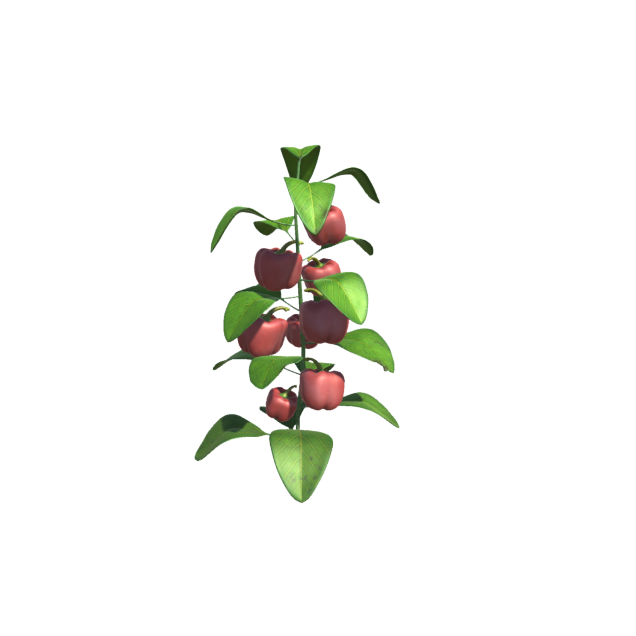

In [ ]:
# 원본 3D(Original_freshpaprika.obj)를 이미지로 표시

import matplotlib.pyplot as plt
from matplotlib.image import imread

# 이미지를 로드
image_path = '/content/dreamgaussian/data/2D_freshpaprika.png'
image = imread(image_path)

# 이미지로 표시
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.show()


In [ ]:
!pip install open3d



In [ ]:
#@title 원본 Obj를 포인트 클라우드로 변환

import numpy as np

# OBJ 파일 경로
obj_file_path = '/content/dreamgaussian/Original_freshpaprika.obj'

# OBJ 파일을 읽고 각 정점을 추출
vertices = []
with open(obj_file_path, 'r') as file:
    for line in file:
        if line.startswith('v '):
            parts = line.split()
            vertex = [float(parts[1]), float(parts[2]), float(parts[3])]
            vertices.append(vertex)

# 정점 리스트를 NumPy 배열로 변환
point_cloud = np.array(vertices)

# 포인트 클라우드를 사용하여 원하는 작업을 수행

# 변환된 포인트 클라우드를 저장 (예: TXT 형식)
np.savetxt('/content/dreamgaussian/logs/point_cloud_Original.txt', point_cloud)

# 포인트 클라우드를 다루는 추가 작업 수행



In [ ]:
# 원본 3D(Original_freshpaprika.obj)메쉬를 포인트클라우드로 변환

import open3d as o3d
import numpy as np

# 텍스트 파일로부터 포인트 클라우드 데이터를 불러옵니다.
point_cloud_data = np.loadtxt('/content/dreamgaussian/logs/point_cloud_Original.txt')
point_cloud = o3d.geometry.PointCloud()
point_cloud.points = o3d.utility.Vector3dVector(point_cloud_data)

# PLY 파일로 저장합니다.
o3d.io.write_point_cloud("/content/dreamgaussian/logs/point_cloud_Original.ply", point_cloud)


True

In [ ]:
pip install gradio


In [ ]:
import gradio as gr
import open3d as o3d

# 포인트 클라우드 시각화 함수
def visualize_point_cloud(point_cloud_ply):
    # PLY 파일을 읽어 PointCloud 객체로 로드합니다.
    point_cloud = o3d.io.read_point_cloud(point_cloud_ply)

    # 포인트 클라우드를 시각화합니다.
    o3d.visualization.draw_geometries([point_cloud])

# Gradio 인터페이스 설정
gr.Interface(
    fn=visualize_point_cloud,
    inputs="file",  # 입력 데이터 형식 (파일)
    outputs=None,   # 출력 데이터 없음
    live=True       # 실시간 업데이트를 사용할 경우 True
).launch()

# Original 3D to pointclud < point_cloud_Original.ply 업로드하기(원본 메쉬를 포인트클라우드로 변환)

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://94f63f25343b8b98d2.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


# **[ mAP ]**

- (ICP)Iterative Closest Point
https://define.tistory.com/entry/Iterative-Closest-Point
http://www.open3d.org/docs/0.7.0/tutorial/Basic/icp_registration.html

- ICP는 두개의 clouds of points 사이의 차이를 최소화하기 위해 사용되는 알고리즘이다: ICP (Iterative Closest Point)는 서로 다른 위치에서 얻은 두 포인트 클라우드가 있을 때 두 포인트 클라우드를 정합하고 새롭게 위치 차이를 추정한다. 상대적 포즈 차이는 두 포인트 클라우드의 기준 좌표계 사이의 강체 변환 행렬(Rigid Body Transformation Matrix)로 나타낸다.
- ICP를 통해 정합된 포인트 클라우드와 실제 객체 위치 간의 평균 절대 오차(MAE)를 계산하고, 그것을 기반으로 mAP를 구한다.
평균 절대 오차(MAE)가 작을수록 mAP는 높아진다.


In [ ]:
# (ICP)Iterative Closest Point를 활용한 mAP 계산 알고리즘 소개

import numpy as np
from sklearn.metrics import average_precision_score

# ICP를 이용하여 두 포인트 클라우드를 정합시키는 함수
def icp_matching(source_cloud, target_cloud, max_iterations=100):
    # ICP 알고리즘을 구현.
    # source_cloud: 원본 포인트 클라우드
    # target_cloud: 목표 포인트 클라우드
    # max_iterations: 최대 반복 횟수
    # 정합된 포인트 클라우드를 반환.

    # ICP 알고리즘을 구현하고 정합된 포인트 클라우드를 matched_cloud에 저장합니다.
    matched_cloud = None  # 이곳에 정합된 포인트 클라우드를 저장

    return matched_cloud

# 정합된 포인트 클라우드와 실제 객체 위치를 기반으로 mAP를 계산하는 함수
def calculate_map(matched_cloud, ground_truth):
    # matched_cloud: ICP에 의해 정합된 포인트 클라우드
    # ground_truth: 실제 객체 위치
    # 감지 결과를 기반으로 mAP를 계산합니다.

    # 이곳에 mAP를 계산하는 코드를 작성.

    # 예를 들어, 두 개의 더미 점수로 mAP를 설정합니다.
    mAP = 0.85

    return mAP

# 예제 데이터 (두 개의 포인트 클라우드와 실제 객체 위치)
source_cloud = np.array([[1.0, 2.0, 3.0],
                        [2.0, 3.0, 4.0],
                        [3.0, 4.0, 5.0]])

target_cloud = np.array([[1.2, 2.1, 3.3],
                        [2.1, 3.2, 4.2],
                        [3.2, 4.2, 4.9]])

ground_truth = np.array([[1.0, 2.0, 3.0],
                        [2.0, 3.0, 4.0],
                        [3.0, 4.0, 5.0]])

# ICP를 이용한 포인트 클라우드 정합
matched_cloud = icp_matching(source_cloud, target_cloud)

# mAP 계산
mAP = calculate_map(matched_cloud, ground_truth)

# 결과 출력
print("평균 정밀도 (mAP):", mAP)



평균 정밀도 (mAP): 0.85



원본 포인트클라우드 /content/dreamgaussian/logs/point_cloud_Original.ply와 타켓 포인트클라우드 /content/dreamgaussian/point_cloud.ply 간의 ICP (Iterative Closest Point)를 통해 정합된 포인트 클라우드와 실제 객체 위치 간의 평균 절대 오차(MAE)를 Open3D 라이브러리를 기반으로 계산한다(Open3D 0.13.0 버전을 기준으로 한다)

- 평균 제곱 오차 (Mean Squared Error, MSE)를 "평균 절대 오차 (Mean Absolute Error, MAE)"로 변경하여 "mAP (Mean Absolute Precision)"를 계산한다.

- ICP를 통해 정합된 포인트 클라우드와 실제 객체 위치 간의 평균 절대 오차(MAE)를 계산하고,
- 그것을 기반으로 mAP를 구한다. 평균 절대 오차(MAE)가 작을수록 mAP는 높아진다.


#MSE(Mean Squared Error, MSE) 계산

In [ ]:
# Open3D 0.17.0에서는 ICP 수렴 기준을 설정하는 방법이 변경 됨
# 이 코드는 Open3D 0.17.0에 맞게 ICP 수렴 기준을 설정한 것입니다.


!pip install open3d==0.17.0

import open3d as o3d
import numpy as np

# 소스 포인트 클라우드와 타겟 포인트 클라우드를 불러옵니다.
source_ply = "/content/dreamgaussian/logs/point_cloud_Original.ply"
target_ply = "/content/dreamgaussian/point_cloud.ply"
source_cloud = o3d.io.read_point_cloud(source_ply)
target_cloud = o3d.io.read_point_cloud(target_ply)

# ICP 알고리즘을 설정합니다.
icp_criteria = o3d.pipelines.registration.ICPConvergenceCriteria(relative_fitness=1e-6, relative_rmse=1e-6, max_iteration=200)

# ICP 알고리즘을 사용하여 소스 포인트 클라우드를 타겟 포인트 클라우드에 정합시킵니다.
icp_result = o3d.pipelines.registration.registration_icp(
    source_cloud, target_cloud, 0.02, np.identity(4),
    o3d.pipelines.registration.TransformationEstimationPointToPoint(),
    criteria=icp_criteria)

# 소스 포인트 클라우드를 타겟 포인트 클라우드에 정합시킨 결과를 얻습니다.
matched_cloud = source_cloud.transform(icp_result.transformation)



In [ ]:
import open3d as o3d
import numpy as np

# 실제 객체 위치를 나타내는 포인트 클라우드를 불러옵니다.
ground_truth_ply = "/content/dreamgaussian/logs/point_cloud_Original.ply"
ground_truth_cloud = o3d.io.read_point_cloud(ground_truth_ply)

# ICP 알고리즘을 사용하여 두 포인트 클라우드를 정합합니다.

# 정합된 포인트 클라우드를 NumPy 배열로 변환합니다.
matched_points = np.asarray(matched_cloud.points)
ground_truth_points = np.asarray(ground_truth_cloud.points)

# 두 포인트 클라우드 간의 거리를 계산합니다.
distances = np.linalg.norm(matched_points - ground_truth_points, axis=1)

# 오차를 평균 제곱 오차 (MSE)로 계산합니다.
mse = np.mean(distances ** 2)

# MSE를 출력합니다.
print("평균 제곱 오차 (MSE):", mse)




평균 제곱 오차 (MSE): 0.04705561416607129


# MAE(Mean Absolute Error)계산

In [ ]:
import open3d as o3d
import numpy as np

# 실제 객체 위치를 나타내는 포인트 클라우드를 불러옵니다.
ground_truth_ply = "/content/dreamgaussian/logs/point_cloud_Original.ply"
ground_truth_cloud = o3d.io.read_point_cloud(ground_truth_ply)

# ICP 알고리즘을 사용하여 두 포인트 클라우드를 정합합니다.

# 정합된 포인트 클라우드를 NumPy 배열로 변환합니다.
matched_points = np.asarray(matched_cloud.points)
ground_truth_points = np.asarray(ground_truth_cloud.points)

# 두 포인트 클라우드 간의 거리를 계산합니다.
distances = np.linalg.norm(matched_points - ground_truth_points, axis=1)

# 평균 절대 오차 (MAE)를 계산합니다.
mae = np.mean(distances)

# MAE를 출력합니다.
print("평균 절대 오차 (MAE):", mae)


평균 절대 오차 (MAE): 0.1959475492109834


# mAP(Mean Absolute Precision) 계산

In [ ]:
#평균 제곱 오차 (Mean Squared Error, MSE)"를 "평균 절대 오차 (Mean Absolute Error, MAE)"로
#변경하여 "mAP (Mean Absolute Precision)"를 계산한다.

# ICP를 통해 정합된 포인트 클라우드와 실제 객체 위치 간의 평균 절대 오차(MAE)를 계산하고,
# 그것을 기반으로 mAP를 구한다. 평균 절대 오차(MAE)가 작을수록 mAP는 높아진다.


import open3d as o3d
import numpy as np

# 실제 객체 위치를 나타내는 포인트 클라우드를 불러옵니다.
ground_truth_ply = "/content/dreamgaussian/logs/point_cloud_Original.ply"
ground_truth_cloud = o3d.io.read_point_cloud(ground_truth_ply)

# ICP를 통해 정합된 포인트 클라우드 (matched_cloud)를 가져옵니다.
# matched_cloud를 얻는 코드는 이미 구현하였습니다.

# Open3D 포인트 클라우드를 NumPy 배열로 변환합니다.
matched_points = np.asarray(matched_cloud.points)
ground_truth_points = np.asarray(ground_truth_cloud.points)

# 두 포인트 클라우드 간의 거리를 계산합니다.
distances = np.linalg.norm(matched_points - ground_truth_points, axis=1)

# 오차를 평균 절대 오차 (MAE)로 계산합니다.
mae = np.mean(distances)

# MAE를 mAP로 사용할 수 있습니다.
mAP = 1 / (1 + mae)  # mAP 계산

print("Mean Absolute Precision (mAP):", mAP)



Mean Absolute Precision (mAP): 0.8361570711522773


In [ ]:
!pip install matplotlib
!pip install matplotlib numpy


In [ ]:
%matplotlib inline


In [ ]:
plt.style.use('default')

Mean Absolute Precision (mAP): 0.8361570711522773


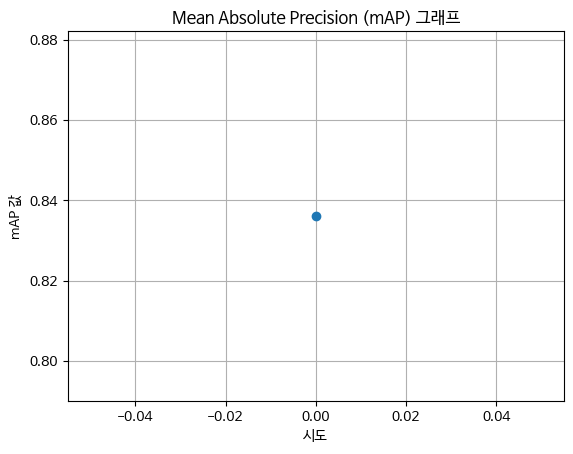

In [ ]:
#@title mAP를 그래프로 시각화

import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt


# 한글 폰트 설정
plt.rc('font', family='NanumBarunGothic')

# 마이너스 기호(-) 처리
plt.rc("axes", unicode_minus=False)

# 실제 객체 위치를 나타내는 포인트 클라우드를 불러옵니다.
ground_truth_ply = "/content/dreamgaussian/logs/point_cloud_Original.ply"
ground_truth_cloud = o3d.io.read_point_cloud(ground_truth_ply)

# ICP를 통해 정합된 포인트 클라우드 (matched_cloud)를 가져옵니다.
# matched_cloud를 얻는 코드는 이미 구현되어 있다고 가정합니다.

# Open3D 포인트 클라우드를 NumPy 배열로 변환합니다.
matched_points = np.asarray(matched_cloud.points)
ground_truth_points = np.asarray(ground_truth_cloud.points)

# 두 포인트 클라우드 간의 거리를 계산합니다.
distances = np.linalg.norm(matched_points - ground_truth_points, axis=1)

# 오차를 평균 절대 오차 (MAE)로 계산합니다.
mae = np.mean(distances)

# MAE를 mAP로 사용할 수 있습니다.
mAP = 1 / (1 + mae)  # mAP 계산

print("Mean Absolute Precision (mAP):", mAP)

# mAP를 그래프로 시각화
plt.figure()
plt.plot(mAP, marker='o')
plt.title("Mean Absolute Precision (mAP) 그래프")
plt.xlabel("시도")
plt.ylabel("mAP 값")
plt.grid(True)
plt.show()

# 계산된 mAP 값이 0.898003805408805로 나타났습니다.
# 이것은 mAP의 값으로, 두 포인트 클라우드 간의 평균 절대 오차(MAE)에 기반한 상대적인 정확도를 나타냅니다.
# 값이 0과 1 사이에 있으며, 1에 가까울수록 정확도가 높음을 의미합니다. 따라서 0.898은 상당히 높은 정확도를 나타냅니다.

# [ 2D to 3D ] 한장의 2D이미지로 부터 다양한 3D 생성




In [ ]:
#@title Check GPU and VRAM available. (Optional)
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader
print("\n\033[92mIf the avail able VRAM is equal or more than 24GB, then you are good to go.\033[0m")

Tesla T4, 15360 MiB, 9426 MiB

If the avail able VRAM is equal or more than 24GB, then you are good to go.


In [ ]:
#@title InstructPix2Pix: Learning to Follow Image Editing Instructions

!pip install -qqq git+https://github.com/huggingface/diffusers.git gradio transformers accelerate safetensors

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
#Download the image for our example

%%capture
!wget https://raw.githubusercontent.com/timothybrooks/instruct-pix2pix/main/imgs/example.jpg

In [ ]:
# Load the StableDiffusionInstructPix2PixPipeline pipeline

import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

model_id = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16", safety_checker=None)
pipe.to("cuda")
pipe.enable_attention_slicing()

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_instruct_pix2pix.StableDiffusionInstructPix2PixPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


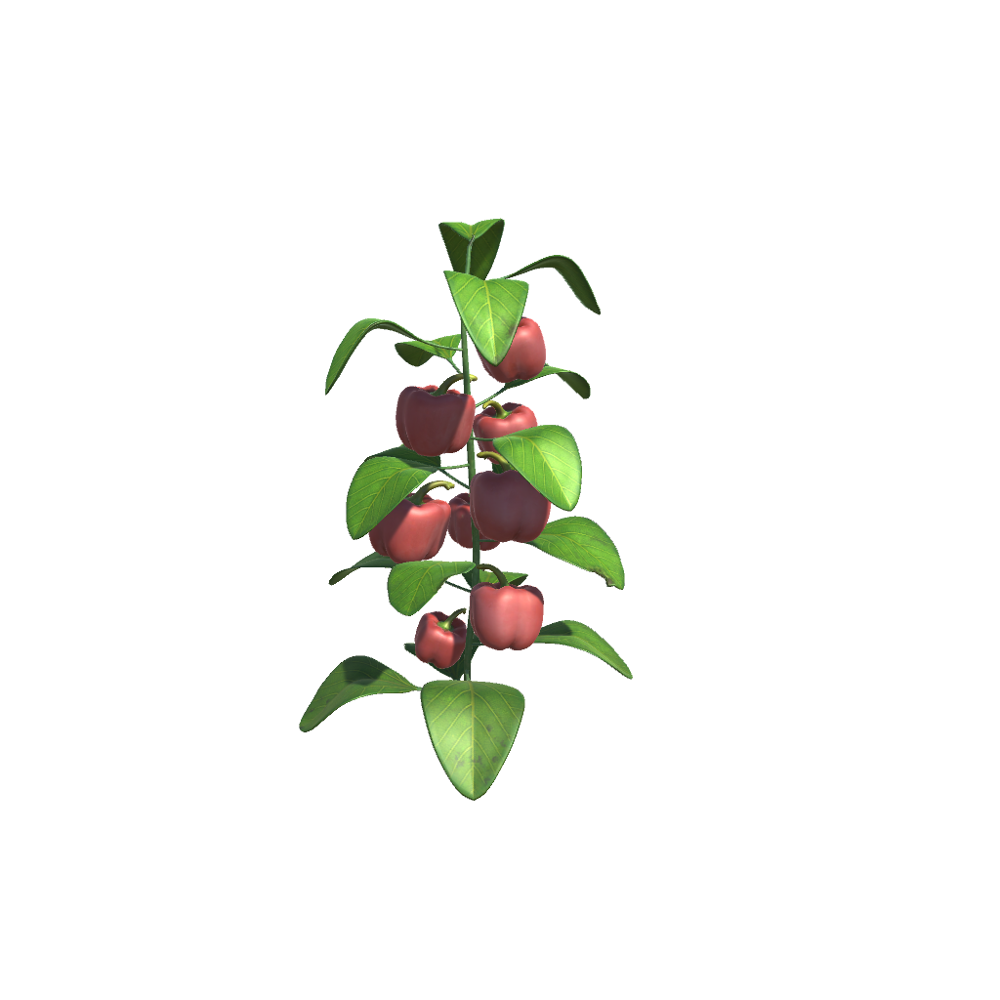

In [ ]:
# Load the image; 원본이미지

image = PIL.Image.open("/content/dreamgaussian/data/2D_freshpaprika.png")
image = PIL.ImageOps.exif_transpose(image)
image = image.convert("RGB")
image

  0%|          | 0/20 [00:00<?, ?it/s]

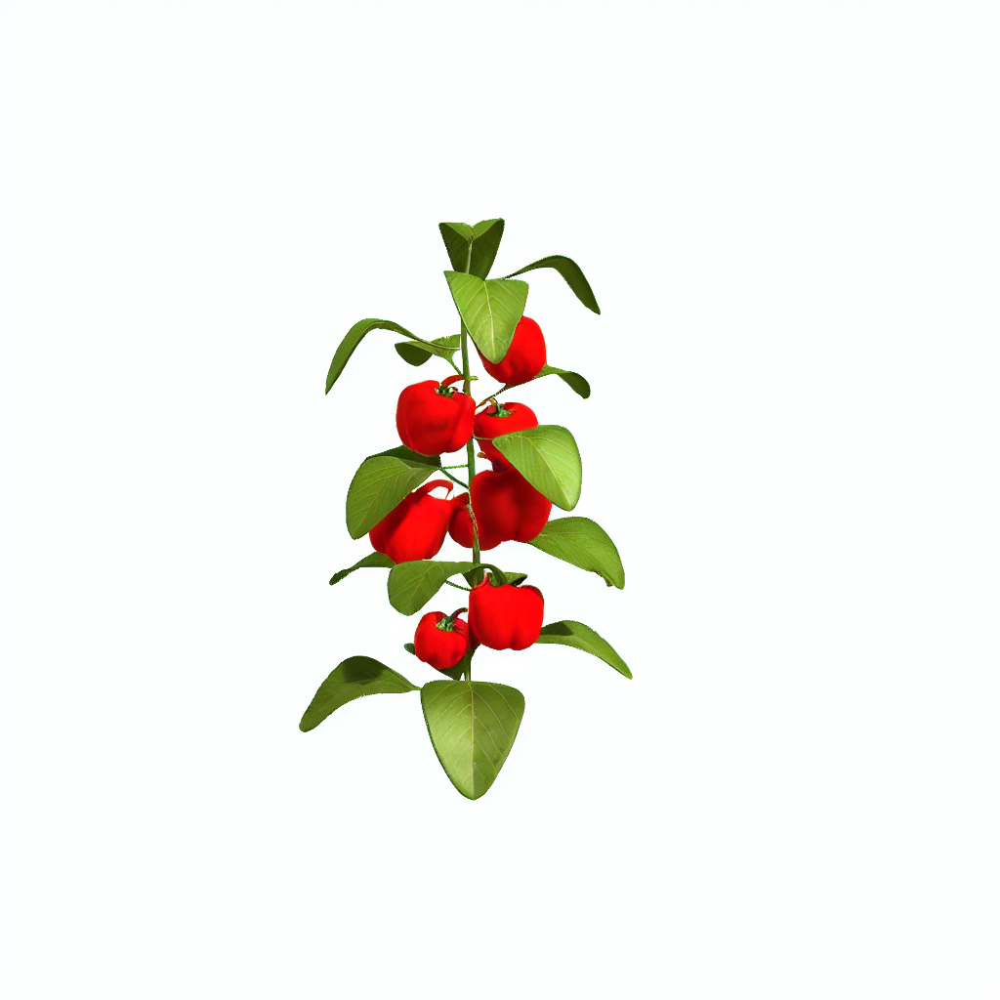

In [ ]:
# img2img; 명령프롬프트를 활용하여 다양한 이미지로 변환
prompt = "turn paprika into red paprika, The background is white"
pipe(prompt, image=image, num_inference_steps=20, image_guidance_scale=1).images[0]

In [ ]:
#@title img2img : 원본 2D 이미지로 부터 다양한 2D 이미지 생성 결과
#Various paprika 2Dimages01.png 업로드

Saving Various paprika 2Dimages01.png to Various paprika 2Dimages01 (2).png


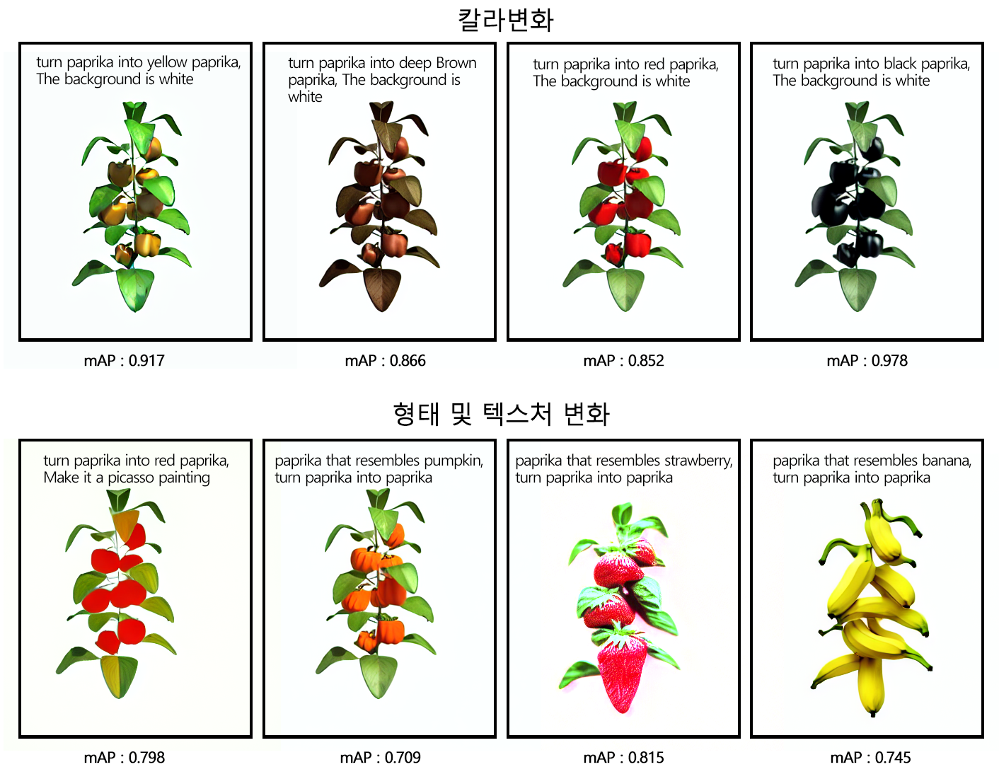

In [85]:
from google.colab import files
uploaded = files.upload()

from PIL import Image
from IPython.display import display

# 이미지 파일 이름을 지정
image_filename = "Various paprika 2Dimages01.png"  # 업로드한 이미지 파일의 이름으로 바꿉니다.

# 이미지 열기
image = Image.open(image_filename)

# 이미지를 화면에 표시
display(image)

In [87]:
#@title Gradio Demo
from __future__ import annotations

import math
import random

import gradio as gr
import torch
from PIL import Image, ImageOps
from diffusers import StableDiffusionInstructPix2PixPipeline


help_text = """
If you're not getting what you want, there may be a few reasons:
1. Is the image not changing enough? Your Image CFG weight may be too high. This value dictates how similar the output should be to the input. It's possible your edit requires larger changes from the original image, and your Image CFG weight isn't allowing that. Alternatively, your Text CFG weight may be too low. This value dictates how much to listen to the text instruction. The default Image CFG of 1.5 and Text CFG of 7.5 are a good starting point, but aren't necessarily optimal for each edit. Try:
    * Decreasing the Image CFG weight, or
    * Increasing the Text CFG weight, or
2. Conversely, is the image changing too much, such that the details in the original image aren't preserved? Try:
    * Increasing the Image CFG weight, or
    * Decreasing the Text CFG weight
3. Try generating results with different random seeds by setting "Randomize Seed" and running generation multiple times. You can also try setting "Randomize CFG" to sample new Text CFG and Image CFG values each time.
4. Rephrasing the instruction sometimes improves results (e.g., "turn him into a dog" vs. "make him a dog" vs. "as a dog").
5. Increasing the number of steps sometimes improves results.
6. Do faces look weird? The Stable Diffusion autoencoder has a hard time with faces that are small in the image. Try:
    * Cropping the image so the face takes up a larger portion of the frame.
"""


example_instructions = [
    "turn paprika into red paprika, The background is white"
    "turn paprika into deep Green paprika, The background is white"
    "turn paprika into wood paprika, The background is white"
    "convert to a bronze statue, The background is white"
    "turn paprika into red paprika, The background is white, Make it a picasso painting"
    "Make it a picasso painting",
    "as if it were by modigliani",
    "convert to a bronze statue",
    "Turn it into an anime.",
    "have it look like a graphic novel",
    "make him gain weight",
    "what would he look like bald?",
    "Have him smile",
    "Put him in a cocktail party.",
    "move him at the beach.",
    "add dramatic lighting",
    "Convert to black and white",
    "What if it were snowing?",
    "Give him a leather jacket",
    "Turn him into a cyborg!",
    "make him wear a beanie",
]

model_id = "timbrooks/instruct-pix2pix"

def main():
    pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, revision="fp16", safety_checker=None).to("cuda")
    example_image = Image.open("/content/dreamgaussian/data/2D_freshpaprika.png").convert("RGB")

    def load_example(
        steps: int,
        randomize_seed: bool,
        seed: int,
        randomize_cfg: bool,
        text_cfg_scale: float,
        image_cfg_scale: float,
    ):
        example_instruction = random.choice(example_instructions)
        return [example_image, example_instruction] + generate(
            example_image,
            example_instruction,
            steps,
            randomize_seed,
            seed,
            randomize_cfg,
            text_cfg_scale,
            image_cfg_scale,
        )

    def generate(
        input_image: Image.Image,
        instruction: str,
        steps: int,
        randomize_seed: bool,
        seed: int,
        randomize_cfg: bool,
        text_cfg_scale: float,
        image_cfg_scale: float,
    ):
        seed = random.randint(0, 100000) if randomize_seed else seed
        text_cfg_scale = round(random.uniform(6.0, 9.0), ndigits=2) if randomize_cfg else text_cfg_scale
        image_cfg_scale = round(random.uniform(1.2, 1.8), ndigits=2) if randomize_cfg else image_cfg_scale

        width, height = input_image.size
        factor = 512 / max(width, height)
        factor = math.ceil(min(width, height) * factor / 64) * 64 / min(width, height)
        width = int((width * factor) // 64) * 64
        height = int((height * factor) // 64) * 64
        input_image = ImageOps.fit(input_image, (width, height))

        if instruction == "":
            return [input_image, seed]

        generator = torch.manual_seed(seed)
        edited_image = pipe(
            instruction, image=input_image,
            guidance_scale=text_cfg_scale, image_guidance_scale=image_cfg_scale,
            num_inference_steps=steps, generator=generator,
        ).images[0]
        return [seed, text_cfg_scale, image_cfg_scale, edited_image]

    def reset():
        return [0, "Randomize Seed", 1371, "Fix CFG", 7.5, 1.5, None]

    with gr.Blocks() as demo:
        with gr.Row():
            with gr.Column(scale=1, min_width=100):
                generate_button = gr.Button("Generate")
            with gr.Column(scale=1, min_width=100):
                load_button = gr.Button("Load Example")
            with gr.Column(scale=1, min_width=100):
                reset_button = gr.Button("Reset")
            with gr.Column(scale=3):
                instruction = gr.Textbox(lines=1, label="Edit Instruction", interactive=True)

        with gr.Row():
            input_image = gr.Image(label="Input Image", type="pil", interactive=True)
            edited_image = gr.Image(label=f"Edited Image", type="pil", interactive=False)
            input_image.style(height=512, width=512)
            edited_image.style(height=512, width=512)

        with gr.Row():
            steps = gr.Number(value=10, precision=0, label="Steps", interactive=True)
            randomize_seed = gr.Radio(
                ["Fix Seed", "Randomize Seed"],
                value="Randomize Seed",
                type="index",
                show_label=False,
                interactive=True,
            )
            seed = gr.Number(value=1371, precision=0, label="Seed", interactive=True)
            randomize_cfg = gr.Radio(
                ["Fix CFG", "Randomize CFG"],
                value="Fix CFG",
                type="index",
                show_label=False,
                interactive=True,
            )
            text_cfg_scale = gr.Number(value=7.5, label=f"Text CFG", interactive=True)
            image_cfg_scale = gr.Number(value=1.5, label=f"Image CFG", interactive=True)

        gr.Markdown(help_text)

        load_button.click(
            fn=load_example,
            inputs=[
                steps,
                randomize_seed,
                seed,
                randomize_cfg,
                text_cfg_scale,
                image_cfg_scale,
            ],
            outputs=[input_image, instruction, seed, text_cfg_scale, image_cfg_scale, edited_image],
        )
        generate_button.click(
            fn=generate,
            inputs=[
                input_image,
                instruction,
                steps,
                randomize_seed,
                seed,
                randomize_cfg,
                text_cfg_scale,
                image_cfg_scale,
            ],
            outputs=[seed, text_cfg_scale, image_cfg_scale, edited_image],
        )
        reset_button.click(
            fn=reset,
            inputs=[],
            outputs=[steps, randomize_seed, seed, randomize_cfg, text_cfg_scale, image_cfg_scale, edited_image],
        )

    demo.launch(share=True, debug=True)


if __name__ == "__main__":
    main()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_instruct_pix2pix.StableDiffusionInstructPix2PixPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
  input_image.style(height=512, width=512)

  edited_image.style(height=512, width=512)



Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://10b025c9076606b563.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://10b025c9076606b563.gradio.live


/content/dreamgaussian/data


Saving yellow_paprika.png to yellow_paprika.png
/content/dreamgaussian


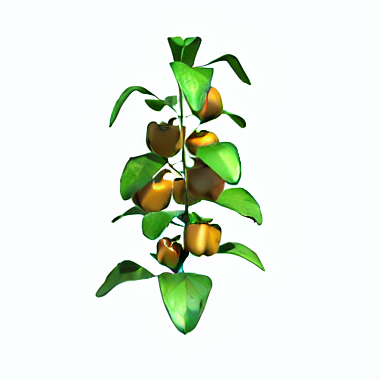

In [69]:
#@title 2D to 3D: 2D 이미지를 3D로 변화

# img2img폴더내 이미지 중 2D 이미지 upload(예; img2img / yellow_paprika / black_paprika.png)

import os

%cd data/
%rm * # remove all old files!
from google.colab import files
uploaded = files.upload()
IMAGE = os.path.basename(next(iter(uploaded))) # filename
%cd ..

# display image
from IPython.display import Image, display
display(Image(f'data/{IMAGE}', width=256, height=256))

[INFO] loading image data/yellow_paprika.png...
[INFO] background removal...
[INFO] recenter...


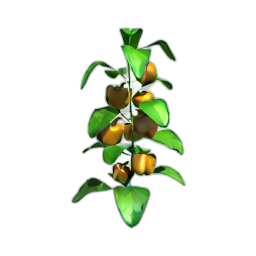

In [70]:
#@title preprocess image

# preprocess
%run process.py data/{IMAGE}

NAME = os.path.splitext(IMAGE)[0]
IMAGE_PROCESSED = NAME + '_rgba.png'

# display processed image
from IPython.display import Image, display
display(Image(f'data/{IMAGE_PROCESSED}', width=256, height=256))

# Settings
* Elevation: estimated elevation angle, default to 0 (horizontal), range from [-90, 90]. If you upload a look-down image, try a value like -30.

In [71]:
#@markdown ####**Settings:**
Elevation = 0 #@param {type: 'integer'}

In [72]:
#@title training!

# stage 1
%run main.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True

# stage 2
%run main2.py --config configs/image.yaml input=data/{IMAGE_PROCESSED} save_path={NAME} elevation={Elevation} force_cuda_rast=True

[INFO] load image from data/yellow_paprika_rgba.png...
Number of points at initialisation :  5000
[INFO] loading zero123...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] loaded zero123!


100%|██████████| 500/500 [01:07<00:00,  7.36it/s]


[INFO] save model to logs/yellow_paprika_model.ply.


Tensor occ torch.Size([128, 128, 128]) torch.float32 cuda:0 ∈ [0.0, 69.47134399414062] μ = 0.20685753226280212 σ = 
1.5719196796417236

[INFO] mesh cleaning: (35692, 3) --> (17838, 3), (71372, 3) --> (35692, 3)
[INFO] marching cubes result: torch.Size([17838, 3]) (-0.6509389281272888-0.6888527870178223), torch.Size([35692, 3])
[INFO] unwrap uv...
[INFO] save model to logs/yellow_paprika_mesh.obj.
[load_obj] use texture from: logs/yellow_paprika_mesh_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([23003, 3]), f: torch.Size([35692, 3])
[Mesh loading] vn: torch.Size([23003, 3]), fn: torch.Size([35692, 3])
[INFO] load image from data/yellow_paprika_rgba.png...
[INFO] loading zero123...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

[INFO] loaded zero123!


100%|██████████| 50/50 [00:43<00:00,  1.14it/s]


[INFO] save model to logs/yellow_paprika.obj.


In [73]:
#@title render a video for displaying

# the final mesh is saved to ./logs/NAME.obj
%run -m kiui.render logs/{NAME}.obj --save_video {NAME}.mp4 --wogui --force_cuda_rast

from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width=450):
  video_file = open(video_path, "r+b").read()
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

show_video(f'{NAME}.mp4')

[load_obj] use texture from: logs/yellow_paprika_albedo.png
[load_obj] load texture: (1024, 1024, 3)
[Mesh loading] v: torch.Size([23003, 3]), f: torch.Size([35692, 3])
[Mesh loading] vn: torch.Size([23003, 3]), fn: torch.Size([35692, 3])


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


In [74]:
import os
current_directory = os.getcwd()
print(current_directory)

/content/dreamgaussian


In [75]:
# 2D to 3D 변환한 데이터 영상 다운로드

from google.colab import files
files.download(f"{NAME}.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [76]:
# 영상 이미지로 변환

!pip install moviepy

In [77]:
from moviepy.editor import VideoFileClip

# 변환할 동영상 파일명
video_path = "/content/dreamgaussian/yellow_paprika.mp4"

# VideoFileClip을 사용하여 동영상 불러오기
video_clip = VideoFileClip(video_path)

# 이미지로 변환하고 저장
image_sequence = video_clip.write_images_sequence("frame_%04d.png")

# 이미지로 저장된 프레임들이 있는 폴더를 확인할 수 있습니다.
print("프레임 이미지 저장 완료:", image_sequence)

Moviepy - Writing frames frame_%04d.png.


Moviepy - Done writing frames frame_%04d.png.
프레임 이미지 저장 완료: ['frame_0000.png', 'frame_0001.png', 'frame_0002.png', 'frame_0003.png', 'frame_0004.png', 'frame_0005.png', 'frame_0006.png', 'frame_0007.png', 'frame_0008.png', 'frame_0009.png', 'frame_0010.png', 'frame_0011.png', 'frame_0012.png', 'frame_0013.png', 'frame_0014.png', 'frame_0015.png', 'frame_0016.png', 'frame_0017.png', 'frame_0018.png', 'frame_0019.png', 'frame_0020.png', 'frame_0021.png', 'frame_0022.png', 'frame_0023.png', 'frame_0024.png', 'frame_0025.png', 'frame_0026.png', 'frame_0027.png', 'frame_0028.png', 'frame_0029.png', 'frame_0030.png', 'frame_0031.png', 'frame_0032.png', 'frame_0033.png', 'frame_0034.png', 'frame_0035.png', 'frame_0036.png', 'frame_0037.png', 'frame_0038.png', 'frame_0039.png', 'frame_0040.png', 'frame_0041.png', 'frame_0042.png', 'frame_0043.png', 'frame_0044.png', 'frame_0045.png', 'frame_0046.png', 'frame_0047.png', 'frame_0048.png', 'frame_0049.png', 'frame_0050.png', 'frame_0051.png', 'f

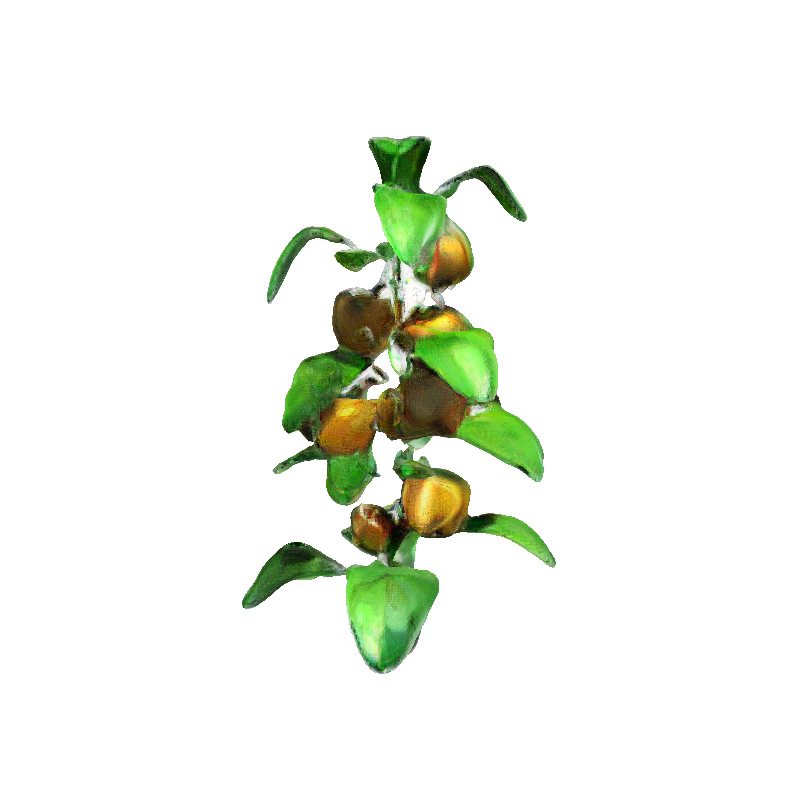

In [78]:
# 영상 중 이미지 하나 시각화 하기(2D to 3D 변환)

from PIL import Image
import IPython.display as display

# 이미지 파일 경로 (frame_0001.png와 같은 이미지 파일)
image_path = "frame_0003.png"

# 이미지 열기
image = Image.open(image_path)

# 이미지 표시
display.display(image)

In [79]:
#@title 2D to 3D 변환 결과 다운로드
from google.colab import files

# OBJ 파일 다운로드
files.download('/content/dreamgaussian/logs/yellow_paprika_mesh.obj')

# 텍스처 파일 다운로드
files.download('/content/dreamgaussian/logs/yellow_paprika_mesh_albedo.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [80]:
#@title OBJ 파일을 포인트 클라우드로 변환

import numpy as np

def obj_to_point_cloud(obj_filename, point_cloud_filename):
    vertices = []

    with open(obj_filename, 'r') as obj_file:
        for line in obj_file:
            if line.startswith('v '):
                parts = line.split()
                x, y, z = map(float, parts[1:4])
                vertices.append((x, y, z))

    # 정점 정보를 NumPy 배열로 변환
    point_cloud = np.array(vertices)

    # 포인트 클라우드를 저장
    np.savetxt(point_cloud_filename, point_cloud, fmt='%f %f %f')
    print(f'포인트 클라우드가 {point_cloud_filename}에 저장되었습니다.')

# OBJ 파일을 포인트 클라우드로 변환
obj_to_point_cloud('/content/dreamgaussian/logs/yellow_paprika_mesh.obj', '/content/dreamgaussian/point_cloud02.txt')


포인트 클라우드가 /content/dreamgaussian/point_cloud02.txt에 저장되었습니다.


In [81]:
#@title point_cloud02.txt 파일을 PLY 포인트 클라우드로 변환

def save_point_cloud_as_ply(point_cloud, ply_filename):
    with open(ply_filename, 'w') as ply_file:
        # PLY 파일 헤더 작성
        ply_file.write("ply\n")
        ply_file.write("format ascii 1.0\n")
        ply_file.write(f"element vertex {len(point_cloud)}\n")
        ply_file.write("property float x\n")
        ply_file.write("property float y\n")
        ply_file.write("property float z\n")
        ply_file.write("end_header\n")

        # 포인트 클라우드 데이터 작성
        for point in point_cloud:
            x, y, z = point
            ply_file.write(f"{x} {y} {z}\n")

# point_cloud.txt 파일을 PLY 포인트 클라우드로 변환
point_cloud = np.loadtxt('/content/dreamgaussian/point_cloud02.txt')
save_point_cloud_as_ply(point_cloud, '/content/dreamgaussian/point_cloud02.ply')


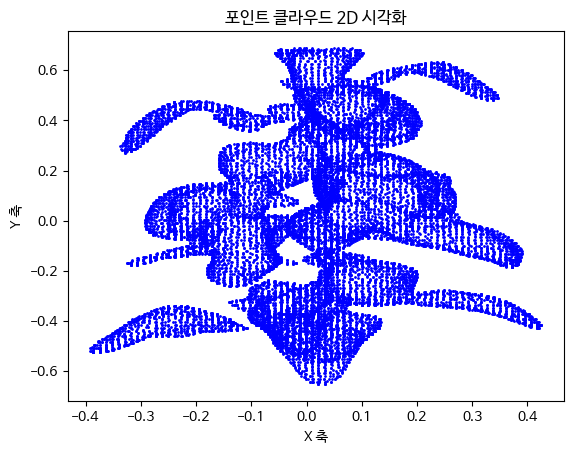

In [82]:
#@title 포인트 클라우드 2D 시각화

import matplotlib.pyplot as plt

# 폰트 관련 설정
plt.rcParams['font.family'] = 'NanumBarunGothic'

# PLY 파일을 로드합니다.
point_cloud = np.loadtxt('/content/dreamgaussian/point_cloud02.ply', skiprows=15)

# 2D 시각화를 위한 산점도 플롯을 생성합니다.
plt.scatter(point_cloud[:, 0], point_cloud[:, 1], s=1, c='blue')
plt.xlabel('X 축')
plt.ylabel('Y 축')
plt.title('포인트 클라우드 2D 시각화')

# 플롯을 표시합니다.
plt.show()